In [1]:
# STEP 1: IMPORTS & SETUP
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import confusion_matrix, classification_report

# Optional: Set seed for reproducibility
import tensorflow as tf
tf.random.set_seed(42)




In [2]:
# 📁 Dataset Path (Adjust this to your unzipped dataset folder)
data_dir = r"C:\Users\Ishan\Internship project\dataset\plantvillage dataset\color"  # Format: dataset/class_name/*.jpg
img_size = (224, 224)
batch_size = 32


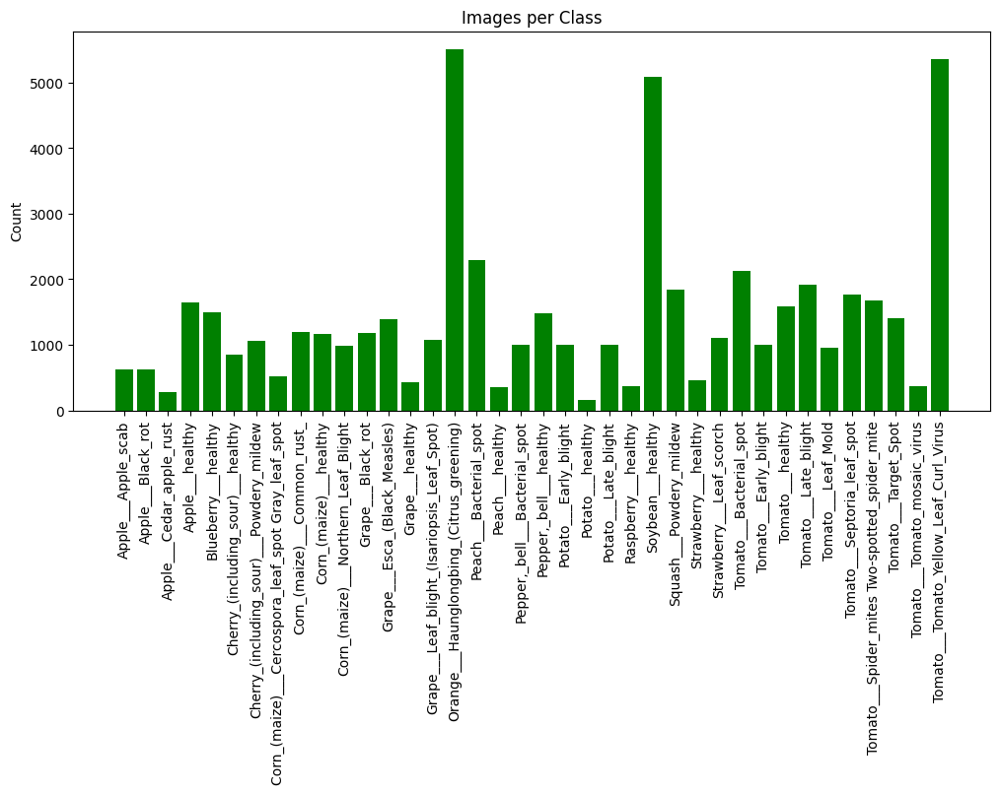

In [4]:
# 📊 STEP 2: EDA - Class Distribution
class_counts = {cls: len(os.listdir(os.path.join(data_dir, cls))) for cls in os.listdir(data_dir)}
plt.figure(figsize=(12, 5))

plt.bar(class_counts.keys(), class_counts.values(), color="green")
plt.xticks(rotation=90)
plt.title("Images per Class")
plt.ylabel("Count")
plt.show()


Text(0.5, 1.0, 'Color Histogram')

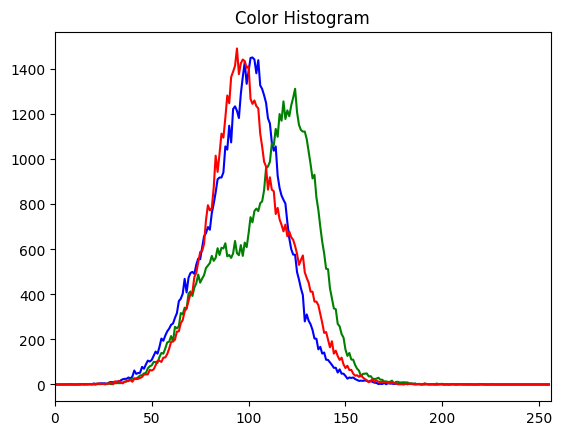

In [52]:
# Use cv2 to extract color histograms
colors = ('b', 'g', 'r')
for i, col in enumerate(colors):
    hist = cv2.calcHist([img], [i], None, [256], [0, 256])
    plt.plot(hist, color=col)
plt.xlim([0, 256])
plt.title("Color Histogram")

In [22]:
from PIL import Image
import os

image_shapes = []

for class_name in os.listdir(data_dir):
    class_path = os.path.join(data_dir, class_name)
    for img_name in os.listdir(class_path):
        if not img_name.lower().endswith(('.jpg', '.jpeg', '.png')):
            continue
        img_path = os.path.join(class_path, img_name)
        try:
            with Image.open(img_path) as img:
                w, h = img.size
                image_shapes.append((w, h))
        except:
            print(f"⚠️ Skipped unreadable image: {img_path}")


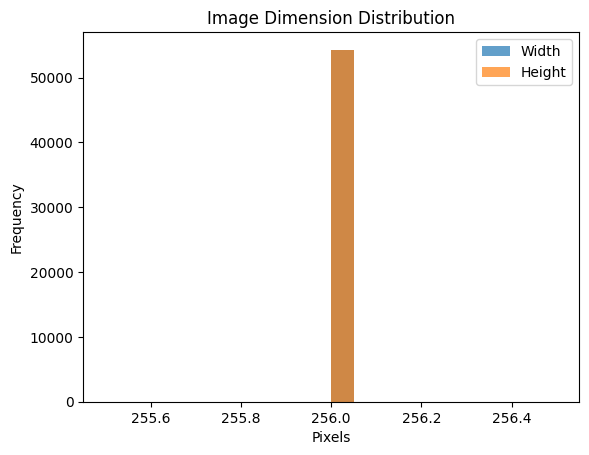

In [23]:
widths = [w for (w, h) in image_shapes]
heights = [h for (w, h) in image_shapes]

plt.hist(widths, bins=20, alpha=0.7, label='Width')
plt.hist(heights, bins=20, alpha=0.7, label='Height')
plt.title("Image Dimension Distribution")
plt.xlabel("Pixels")
plt.ylabel("Frequency")
plt.legend()
plt.show()


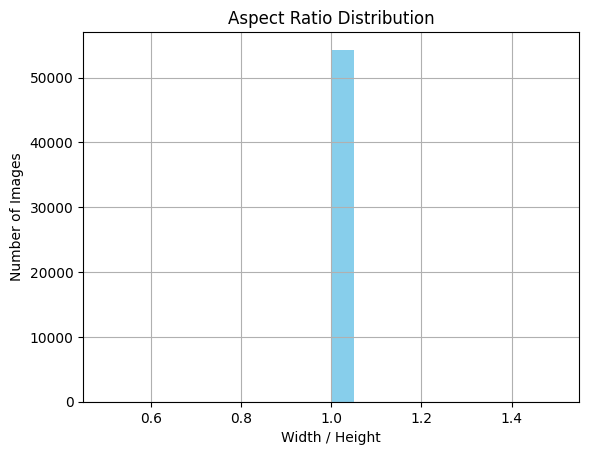

In [24]:
aspect_ratios = [w/h for (w, h) in image_shapes]
plt.hist(aspect_ratios, bins=20, color='skyblue')
plt.title("Aspect Ratio Distribution")
plt.xlabel("Width / Height")
plt.ylabel("Number of Images")
plt.grid(True)
plt.show()


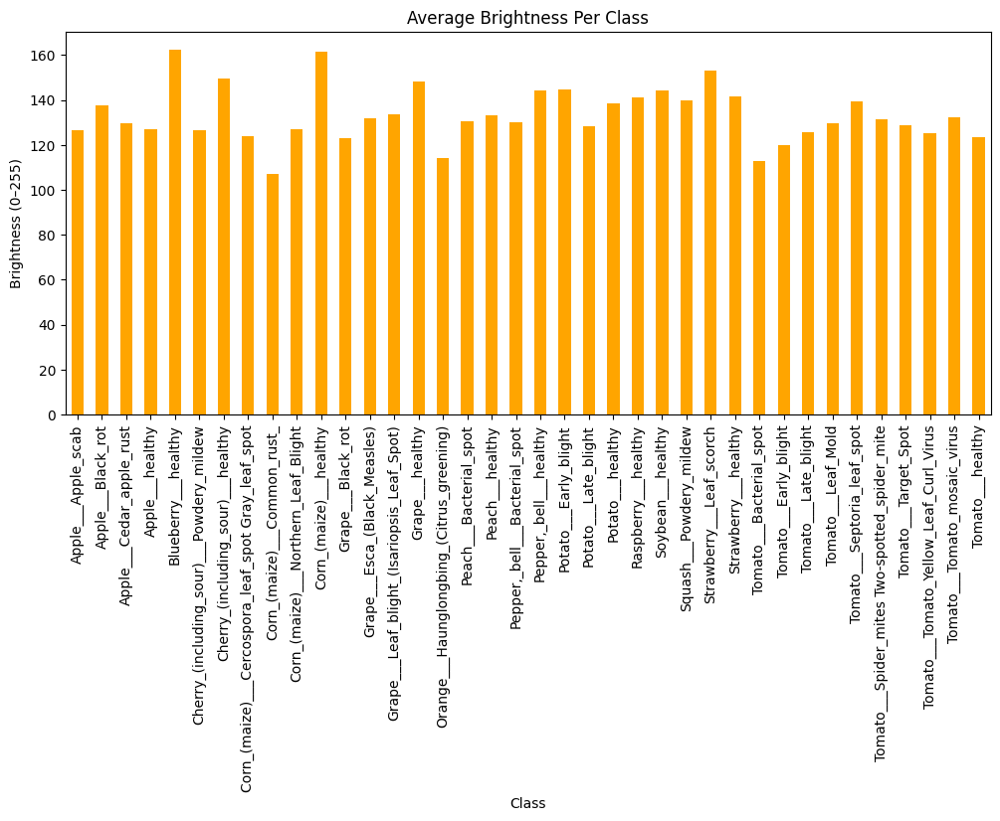

In [ ]:
import pandas as pd
df_brightness = pd.DataFrame(brightness_values, columns=["Class", "Brightness"])
avg_brightness = df_brightness.groupby("Class")["Brightness"].mean()
plt.figure(figsize=(12, 5))
avg_brightness.plot(kind='bar', color='orange')
plt.title("Average Brightness Per Class")
plt.ylabel("Brightness (0–255)")
plt.xticks(rotation=90)
plt.show()


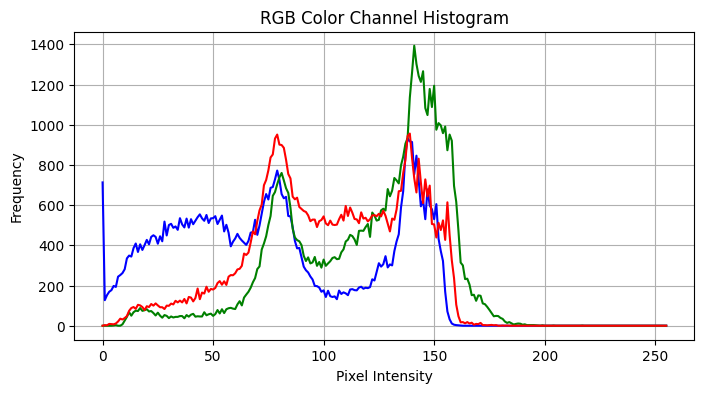

In [29]:
import cv2
import matplotlib.pyplot as plt

# 🔧 Load and verify image path
img = cv2.imread(img_path)

if img is None:
    print("❌ Image failed to load. Check the path:", img_path)
else:
    # ✅ Plot RGB histograms
    colors = ('b', 'g', 'r')
    plt.figure(figsize=(8, 4))
    for i, col in enumerate(colors):
        hist = cv2.calcHist([img], [i], None, [256], [0, 256])
        plt.plot(hist, color=col)
    plt.title("RGB Color Channel Histogram")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")
    plt.grid(True)
    plt.show()


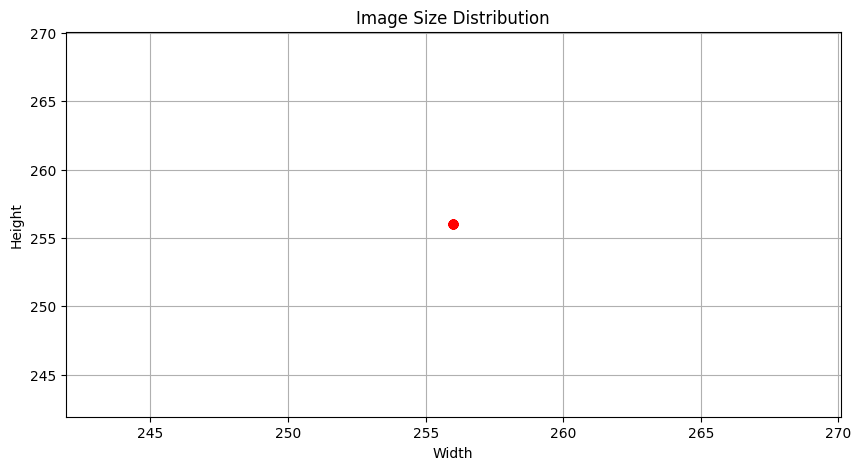

In [56]:
from PIL import Image

widths, heights = [], []

classes = os.listdir(data_dir)

for cls in classes:
    cls_folder = os.path.join(data_dir, cls)
    img_name = os.listdir(cls_folder)[0]
    img_path = os.path.join(cls_folder, img_name)
    img = Image.open(img_path)
    widths.append(img.width)
    heights.append(img.height)

# Plot
plt.figure(figsize=(10,5))
plt.scatter(widths, heights, c='red')
plt.title("Image Size Distribution")
plt.xlabel("Width")
plt.ylabel("Height")
plt.grid(True)
plt.show()


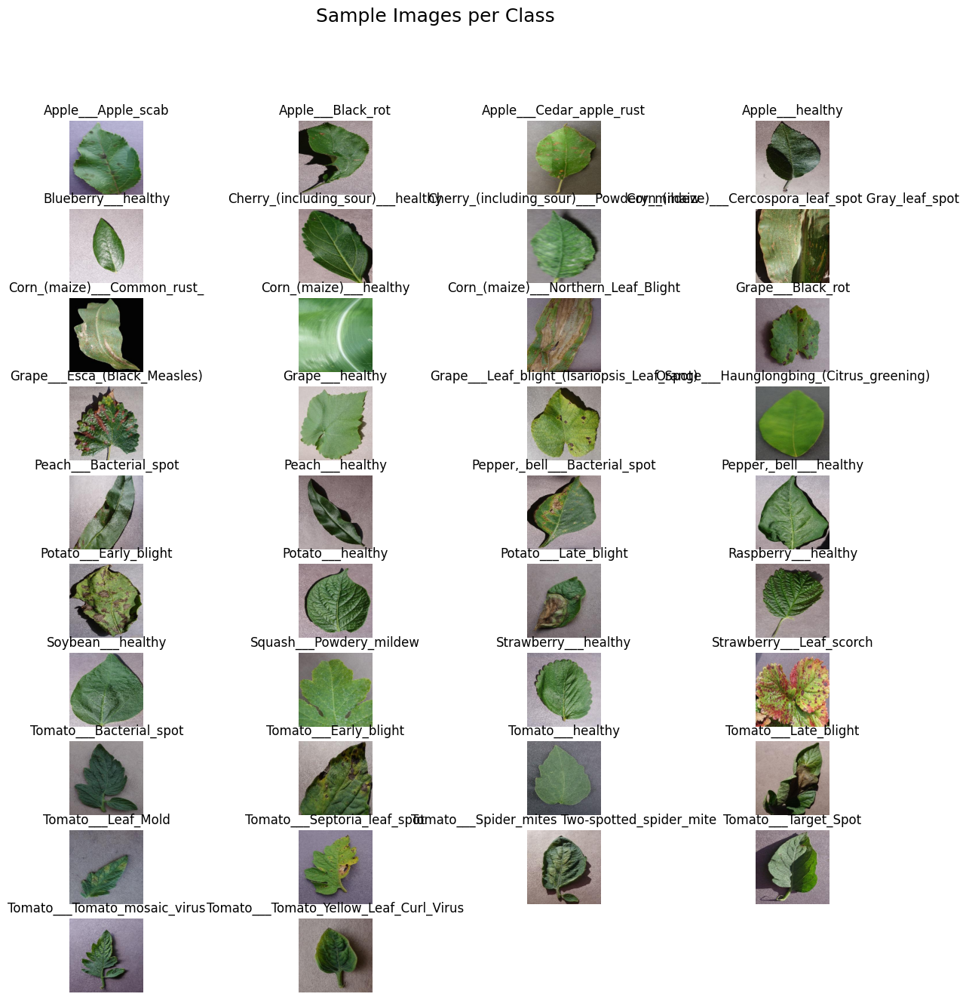

In [74]:
import cv2
import numpy as np

plt.figure(figsize=(15, 15))
for i, cls in enumerate(classes[:38]):
    img_path = os.path.join(data_dir, cls, os.listdir(os.path.join(data_dir, cls))[0])
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(10, 4, i+1)
    plt.imshow(img)
    plt.title(cls)
    plt.axis('off')
plt.suptitle("Sample Images per Class", fontsize=18)
plt.show()


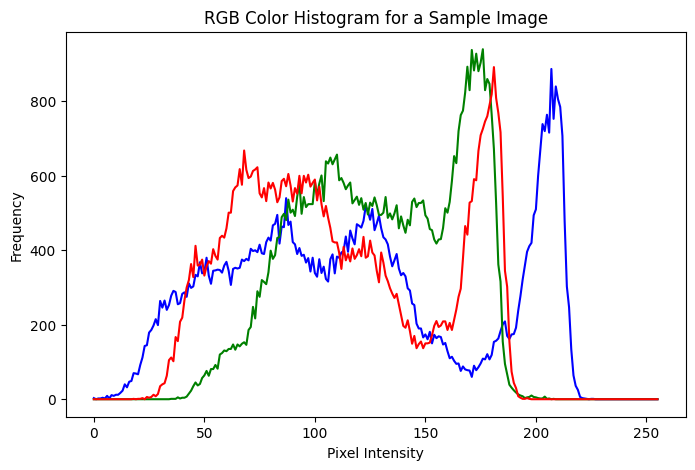

In [76]:
img_path = os.path.join(data_dir, classes[0], os.listdir(os.path.join(data_dir, classes[0]))[0])
img = cv2.imread(img_path)
colors = ('b', 'g', 'r')

plt.figure(figsize=(8,5))
for i, col in enumerate(colors):
    hist = cv2.calcHist([img], [i], None, [256], [0,256])
    plt.plot(hist, color=col)
plt.title("RGB Color Histogram for a Sample Image")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.show()


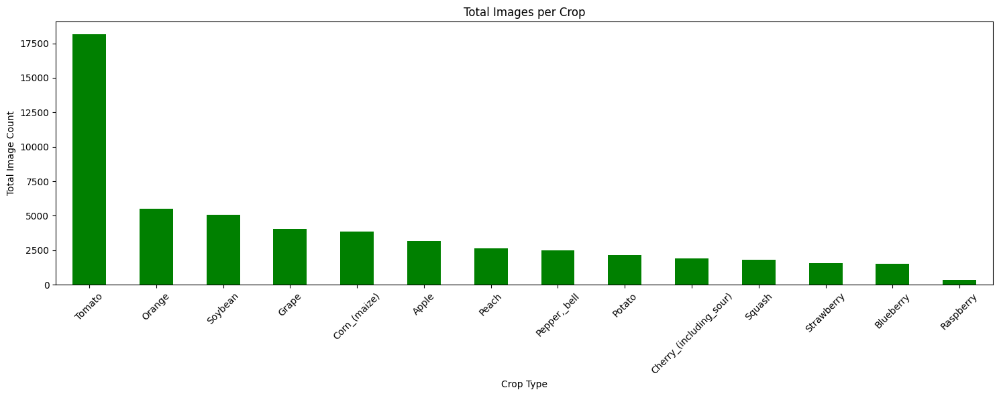

In [77]:
import pandas as pd

# Split class names like "Tomato___Late_blight"
df = pd.DataFrame(list(class_counts.items()), columns=['class', 'count'])
df[['crop', 'disease']] = df['class'].str.split('___', expand=True)

# Plot
plt.figure(figsize=(15,6))
df.groupby('crop')['count'].sum().sort_values(ascending=False).plot(kind='bar', color='green')
plt.title("Total Images per Crop")
plt.xlabel("Crop Type")
plt.ylabel("Total Image Count")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


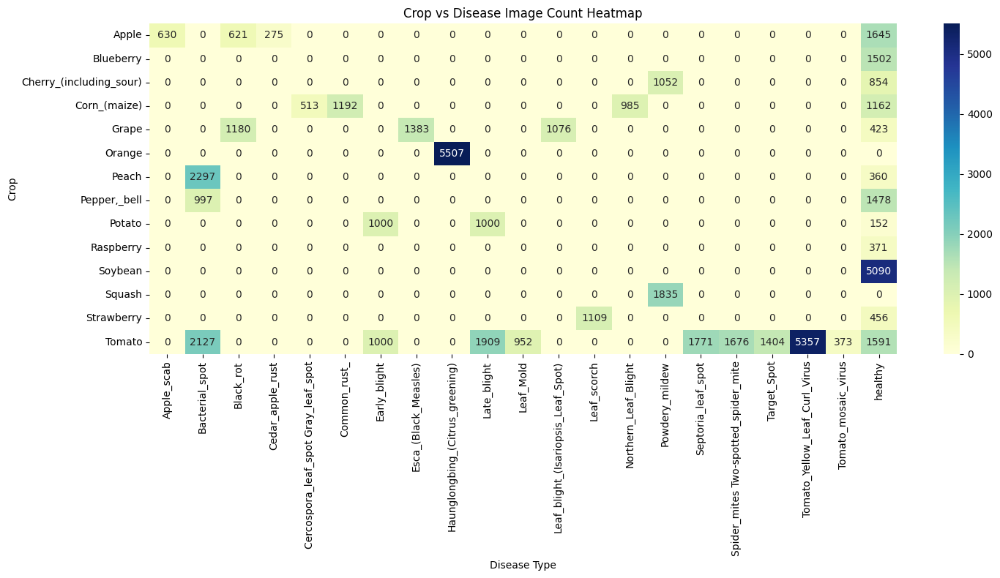

In [85]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming class_counts already exists (from previous code)
# Convert it to a DataFrame and split class name
df = pd.DataFrame(list(class_counts.items()), columns=['class', 'count'])

# Split into 'crop' and 'disease'
df[['crop', 'disease']] = df['class'].str.split('___', expand=True)

# Create pivot table (Crop vs Disease matrix)
pivot_df = df.pivot_table(index='crop', columns='disease', values='count', fill_value=0)

# Plot heatmap
plt.figure(figsize=(15, 8))
sns.heatmap(pivot_df, annot=True, fmt=".0f", cmap="YlGnBu")
plt.title("Crop vs Disease Image Count Heatmap")
plt.xlabel("Disease Type")
plt.ylabel("Crop")
plt.tight_layout()
plt.show()


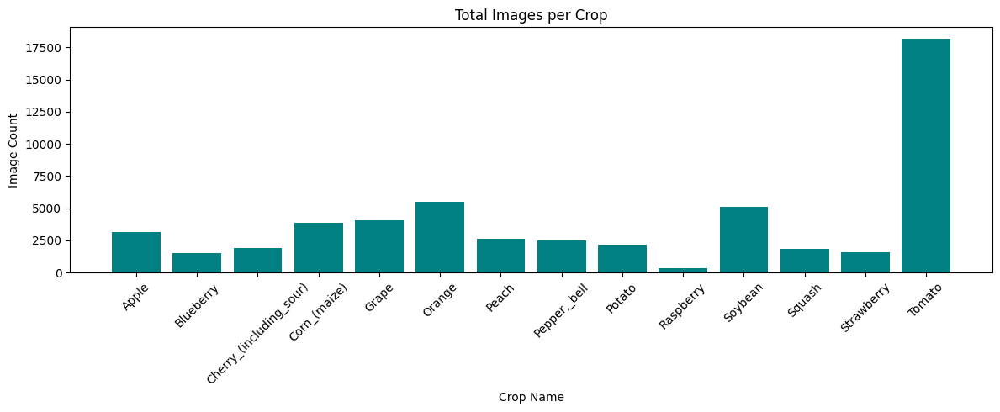

In [79]:
from collections import defaultdict

crop_counts = defaultdict(int)
for cls in class_counts:
    crop = cls.split("___")[0]
    crop_counts[crop] += class_counts[cls]

# Bar plot
plt.figure(figsize=(12,5))
plt.bar(crop_counts.keys(), crop_counts.values(), color='teal')
plt.xticks(rotation=45)
plt.title("Total Images per Crop")
plt.xlabel("Crop Name")
plt.ylabel("Image Count")
plt.tight_layout()
plt.show()


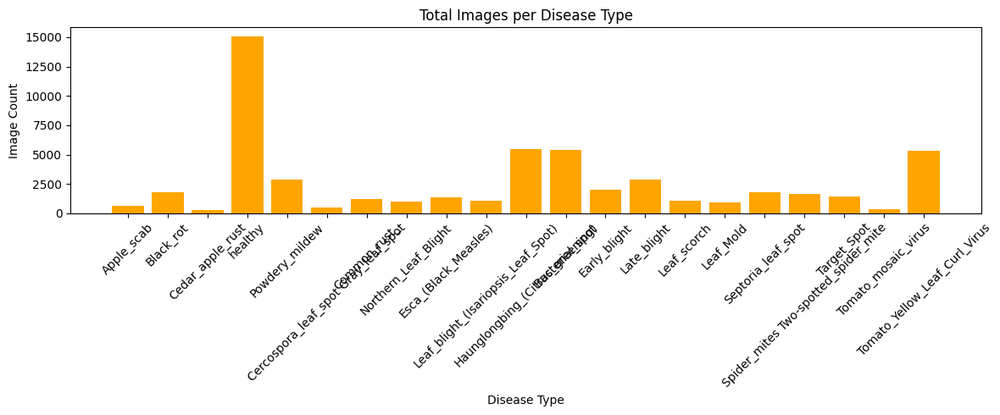

In [80]:
disease_counts = defaultdict(int)
for cls in class_counts:
    if "___" in cls:
        disease = cls.split("___")[1]
    else:
        disease = "healthy"
    disease_counts[disease] += class_counts[cls]

plt.figure(figsize=(12,5))
plt.bar(disease_counts.keys(), disease_counts.values(), color='orange')
plt.xticks(rotation=45)
plt.title("Total Images per Disease Type")
plt.xlabel("Disease Type")
plt.ylabel("Image Count")
plt.tight_layout()
plt.show()


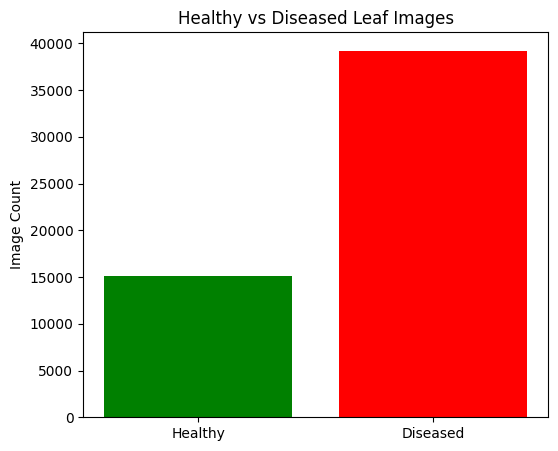

In [82]:
import matplotlib.pyplot as plt

# Calculate healthy and diseased image counts
healthy = sum(count for cls, count in class_counts.items() if 'healthy' in cls.lower())
diseased = sum(class_counts.values()) - healthy  # or total_images = sum(...)

# Bar plot
plt.figure(figsize=(6, 5))
plt.bar(['Healthy', 'Diseased'], [healthy, diseased], color=['green', 'red'])
plt.title("Healthy vs Diseased Leaf Images")
plt.ylabel("Image Count")
plt.show()



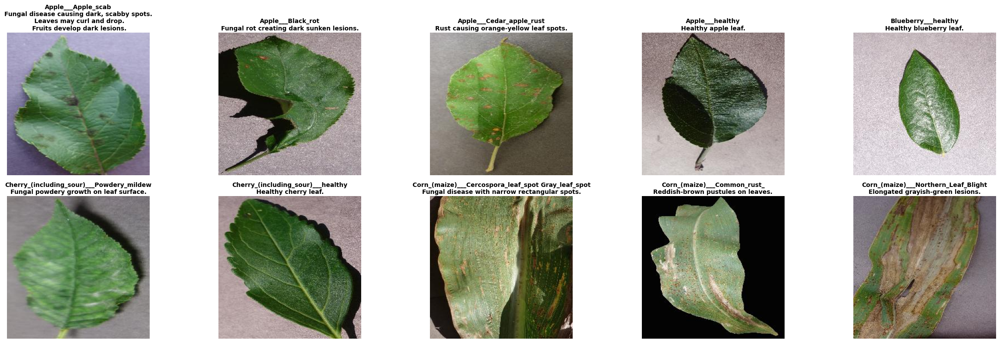

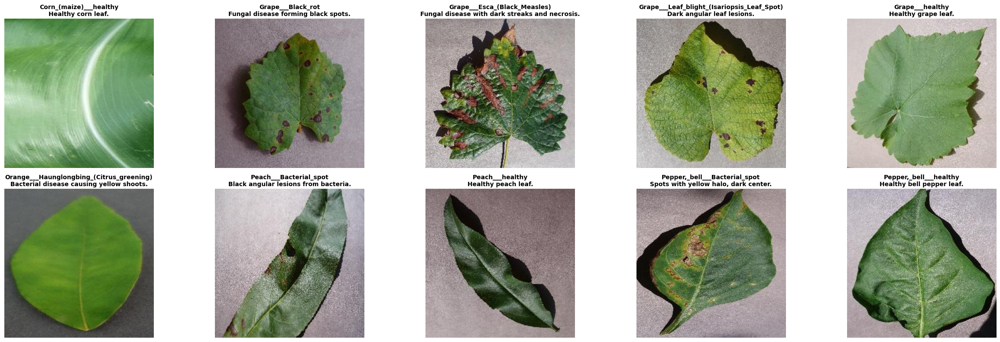

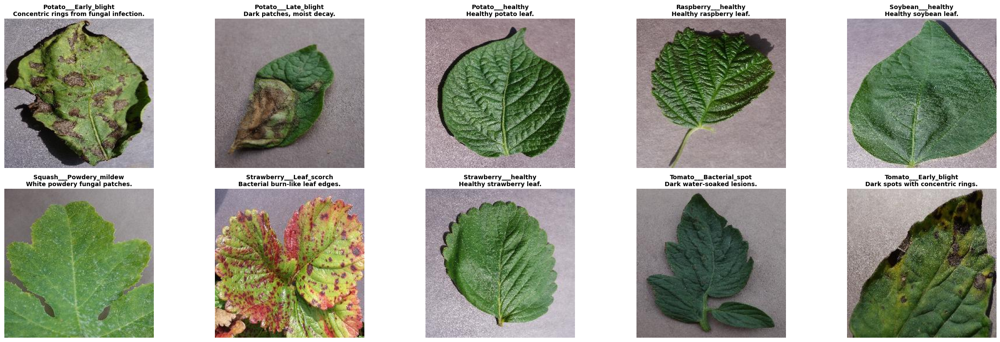

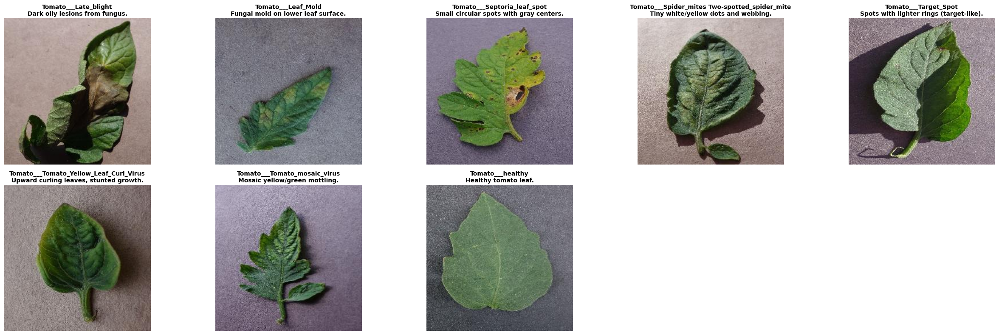

In [92]:
import os
import cv2
import matplotlib.pyplot as plt



# Use the dictionary provided above
disease_descriptions = {
    'Apple___Apple_scab': 'Fungal disease causing dark, scabby spots.\n Leaves may curl and drop.\n Fruits develop dark lesions.',
    'Apple___Black_rot': 'Fungal rot creating dark sunken lesions.',
    'Apple___Cedar_apple_rust': 'Rust causing orange-yellow leaf spots.',
    'Apple___healthy': 'Healthy apple leaf.',
    
    'Blueberry___healthy': 'Healthy blueberry leaf.',

    'Cherry_(including_sour)___Powdery_mildew': 'Fungal powdery growth on leaf surface.',
    'Cherry_(including_sour)___healthy': 'Healthy cherry leaf.',

    'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot': 'Fungal disease with narrow rectangular spots.',
    'Corn_(maize)___Common_rust_': 'Reddish-brown pustules on leaves.',
    'Corn_(maize)___Northern_Leaf_Blight': 'Elongated grayish-green lesions.',
    'Corn_(maize)___healthy': 'Healthy corn leaf.',

    'Grape___Black_rot': 'Fungal disease forming black spots.',
    'Grape___Esca_(Black_Measles)': 'Fungal disease with dark streaks and necrosis.',
    'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)': 'Dark angular leaf lesions.',
    'Grape___healthy': 'Healthy grape leaf.',

    'Orange___Haunglongbing_(Citrus_greening)': 'Bacterial disease causing yellow shoots.',

    'Peach___Bacterial_spot': 'Black angular lesions from bacteria.',
    'Peach___healthy': 'Healthy peach leaf.',

    'Pepper,_bell___Bacterial_spot': 'Spots with yellow halo, dark center.',
    'Pepper,_bell___healthy': 'Healthy bell pepper leaf.',

    'Potato___Early_blight': 'Concentric rings from fungal infection.',
    'Potato___Late_blight': 'Dark patches, moist decay.',
    'Potato___healthy': 'Healthy potato leaf.',

    'Raspberry___healthy': 'Healthy raspberry leaf.',

    'Soybean___healthy': 'Healthy soybean leaf.',

    'Squash___Powdery_mildew': 'White powdery fungal patches.',

    'Strawberry___Leaf_scorch': 'Bacterial burn-like leaf edges.',
    'Strawberry___healthy': 'Healthy strawberry leaf.',

    'Tomato___Bacterial_spot': 'Dark water-soaked lesions.',
    'Tomato___Early_blight': 'Dark spots with concentric rings.',
    'Tomato___Late_blight': 'Dark oily lesions from fungus.',
    'Tomato___Leaf_Mold': 'Fungal mold on lower leaf surface.',
    'Tomato___Septoria_leaf_spot': 'Small circular spots with gray centers.',
    'Tomato___Spider_mites Two-spotted_spider_mite': 'Tiny white/yellow dots and webbing.',
    'Tomato___Target_Spot': 'Spots with lighter rings (target-like).',
    'Tomato___Tomato_Yellow_Leaf_Curl_Virus': 'Upward curling leaves, stunted growth.',
    'Tomato___Tomato_mosaic_virus': 'Mosaic yellow/green mottling.',
    'Tomato___healthy': 'Healthy tomato leaf.'
}


# Get class folders
class_dirs = sorted([f for f in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, f))])

# Show 10 images per figure (for 38 classes, this will create 4 figures)
images_per_fig = 10
num_classes = len(class_dirs)
num_figs = (num_classes + images_per_fig - 1) // images_per_fig

for fig_index in range(num_figs):
    plt.figure(figsize=(25, 8))
    for i in range(images_per_fig):
        idx = fig_index * images_per_fig + i
        if idx >= num_classes:
            break
        label = class_dirs[idx]
        folder_path = os.path.join(data_dir, label)
        image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        if not image_files:
            continue
        img_path = os.path.join(folder_path, image_files[0])
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        description = disease_descriptions.get(label, "No description")

        plt.subplot(2, 5, i + 1)
        plt.imshow(img)
        plt.title(f"{label}\n{description}", fontsize=10, wrap=True, fontweight='bold')
        plt.axis("off")
    plt.tight_layout()
    plt.show()


In [6]:
import os

for dirpath,dirnames,filenames in os.walk(r"C:\Users\Ishan\Internship project\dataset\plantvillage dataset\color"):
  print(f"There are {len(dirnames)} directories and {len(filenames)} images in '{dirpath}'.")

There are 38 directories and 0 images in 'C:\Users\Ishan\Internship project\dataset\plantvillage dataset\color'.
There are 0 directories and 630 images in 'C:\Users\Ishan\Internship project\dataset\plantvillage dataset\color\Apple___Apple_scab'.
There are 0 directories and 621 images in 'C:\Users\Ishan\Internship project\dataset\plantvillage dataset\color\Apple___Black_rot'.
There are 0 directories and 275 images in 'C:\Users\Ishan\Internship project\dataset\plantvillage dataset\color\Apple___Cedar_apple_rust'.
There are 0 directories and 1645 images in 'C:\Users\Ishan\Internship project\dataset\plantvillage dataset\color\Apple___healthy'.
There are 0 directories and 1502 images in 'C:\Users\Ishan\Internship project\dataset\plantvillage dataset\color\Blueberry___healthy'.
There are 0 directories and 854 images in 'C:\Users\Ishan\Internship project\dataset\plantvillage dataset\color\Cherry_(including_sour)___healthy'.
There are 0 directories and 1052 images in 'C:\Users\Ishan\Internship

In [8]:
import pathlib
import numpy as np
data_dir=pathlib.Path(r"C:\Users\Ishan\Internship project\dataset\plantvillage dataset\color")
class_names=np.array(sorted([item.name for item in data_dir.glob("*")]))
print(class_names)

['Apple___Apple_scab' 'Apple___Black_rot' 'Apple___Cedar_apple_rust'
 'Apple___healthy' 'Blueberry___healthy'
 'Cherry_(including_sour)___Powdery_mildew'
 'Cherry_(including_sour)___healthy'
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot'
 'Corn_(maize)___Common_rust_' 'Corn_(maize)___Northern_Leaf_Blight'
 'Corn_(maize)___healthy' 'Grape___Black_rot'
 'Grape___Esca_(Black_Measles)'
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)' 'Grape___healthy'
 'Orange___Haunglongbing_(Citrus_greening)' 'Peach___Bacterial_spot'
 'Peach___healthy' 'Pepper,_bell___Bacterial_spot'
 'Pepper,_bell___healthy' 'Potato___Early_blight' 'Potato___Late_blight'
 'Potato___healthy' 'Raspberry___healthy' 'Soybean___healthy'
 'Squash___Powdery_mildew' 'Strawberry___Leaf_scorch'
 'Strawberry___healthy' 'Tomato___Bacterial_spot' 'Tomato___Early_blight'
 'Tomato___Late_blight' 'Tomato___Leaf_Mold' 'Tomato___Septoria_leaf_spot'
 'Tomato___Spider_mites Two-spotted_spider_mite' 'Tomato___Target_Spot'
 'Tomato___Tom

In [19]:
from pathlib import Path
import random
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def view_random_image(target_dir, target_class):
    # Ensure both are Path objects
    target_dir = Path(target_dir)
    target_folder = target_dir / target_class  # Use / to concatenate paths

    # Get a random image path
    random_image = random.choice(os.listdir(target_folder))
    image_path = target_folder / random_image

    # Display info
    print(f"Class: {target_class}")
    print(f"Image Path: {image_path}")

    # Load and display the image
    img = mpimg.imread(image_path)
    plt.imshow(img)
    plt.title(f"{target_class}")
    plt.axis("off")
    plt.show()

    return img


Class: Potato___Early_blight
Image Path: C:\Users\Ishan\Internship project\dataset\plantvillage dataset\color\Potato___Early_blight\b7157976-61c2-4366-87c5-e3de23aa7c10___RS_Early.B 7227.JPG


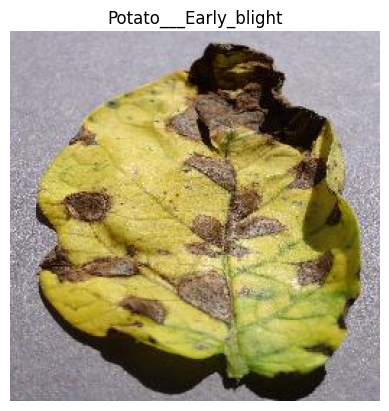

In [20]:

img=view_random_image(target_dir=data_dir,
                      target_class=random.choice(class_names))
